<a href="https://colab.research.google.com/github/AlonsoNeto01/PROCESSAMENTO-DE-IMAGEM/blob/main/Tarefa_4_pi_vc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***Tarefa 4 (em dupla) - Visão Computacional com biblioteca OpenCV***

#**Nome do aluno:**Alonso Sales Moreira Neto // Nicole Souza da Silva

Instruções:

a) Tirar uma foto da turma com pessoas em diferentes situações e carregar do disco do colab (pasta ao lado)

1.   Pessoa sorrindo
2.   Pessoa olhando para o lado
3.   Pessoa séria


b) realizar cada item do roteiro abaixo utilizando e modificando o código em python fornecido pelo professor. O aluno pode e deve incluir qualquer outra operação de processamento como melhora no contraste (equalização de histograma) ou suavização da imagem (eliminação de ruídos com filtro gaussiano) e outros, até que sejam identificadas as faces na imagem.

c) após a finalização da atividade, permita o acesso ao link compartilhado do seu colab e envie o link para o  **CLASSROOM da disciplina**, incluindo as imagens de cada um dos itens (salvas na sua pasta Colab Notebooks no Google Drive)



**Nomes da dupla:**

1- Alonso Sales Moreira Neto

2- Nicole Souza da Silva



# **1) Lendo e Exibindo Imagem:**

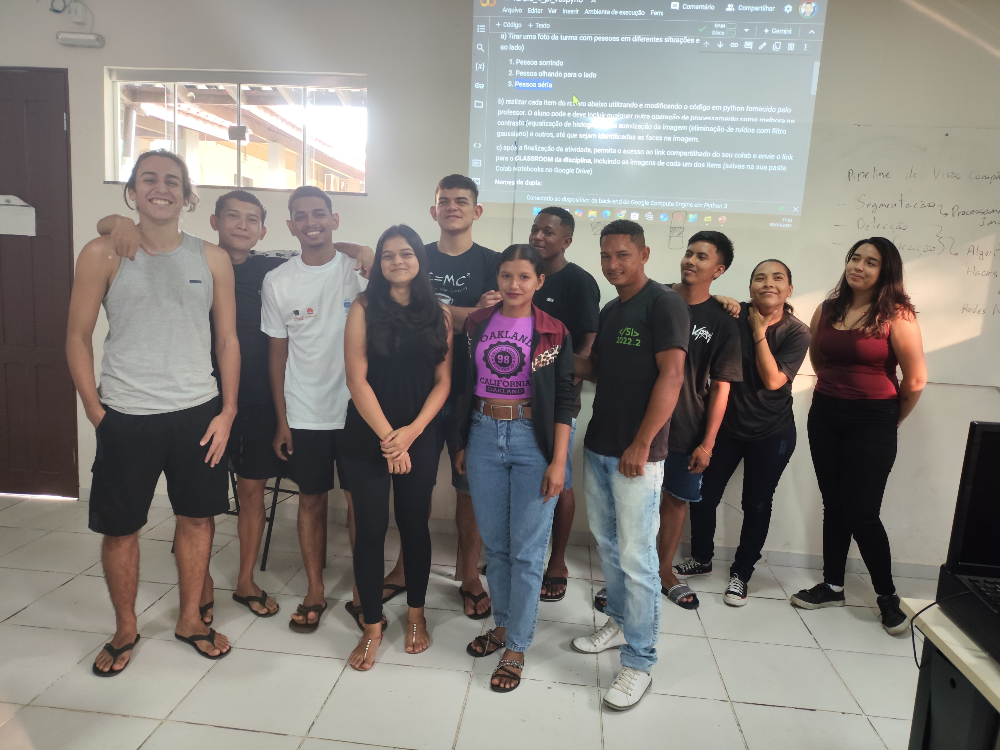

True

In [1]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Carregue uma imagem de uma URL ou arquivo
#imagem = cv2.imread('https://raw.githubusercontent.com/koyachi/go-lena/master/example/lena.result.jpg')

# Carregue a imagem do disco do colab (na pasta à esquerda)
imagem1 = cv2.imread('/content/img.jpeg') # com OpenCV

# Exiba a imagem
cv2_imshow(imagem1)


#******************************************************************************
# Salvar a imagem na pasta local do Colab
cv2.imwrite('/content/imagem_faces1.png', imagem1)

# **2) Redimensionar imagem para tamanho adequado (dimensão da altura deve ser menor que 900 pixels)**



Imagem redimensionada para: 899x1197 pixels.


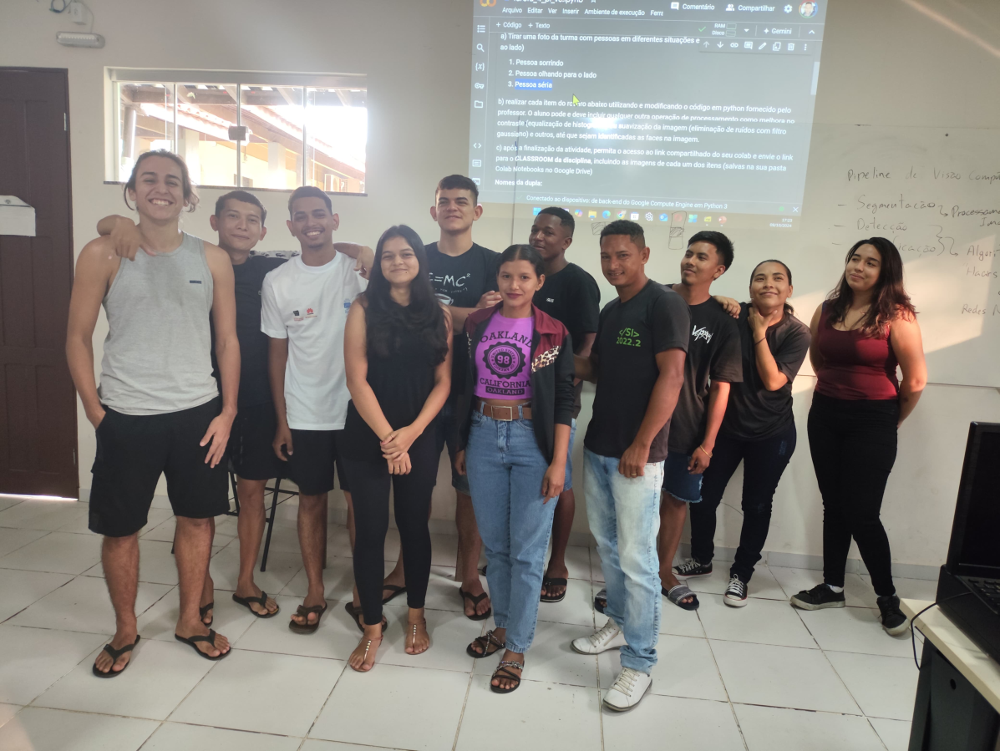

True

In [68]:
import cv2

# Carregar a imagem
imagem = cv2.imread('/content/imagem_faces1.png')

# Obter as dimensões da imagem original
altura_original, largura_original = imagem.shape[:2]

# Definir a nova altura máxima
altura_maxima = 899

# Verificar se a imagem já está abaixo da altura máxima
if altura_original > altura_maxima:
    # Calcular o fator de escala
    fator_escala = altura_maxima / altura_original

    # Calcular a nova largura mantendo a proporção
    nova_largura = int(largura_original * fator_escala)
    nova_altura = altura_maxima

    # Redimensionar a imagem
    imagem_redimensionada = cv2.resize(imagem, (nova_largura, nova_altura), interpolation=cv2.INTER_AREA)

    # Exibir a imagem redimensionada
    print(f"Imagem redimensionada para: {nova_altura}x{nova_largura} pixels.")
    cv2_imshow(imagem_redimensionada)
else:
    print("A imagem já está abaixo da altura máxima.")
    cv2_imshow(imagem)

# Salvar a imagem redimensionada (opcional)
cv2.imwrite('/content/IMAGEM_REDIMENSIONADA.jpg', imagem_redimensionada)


# **3) Detecção de Faces com OpenCV**

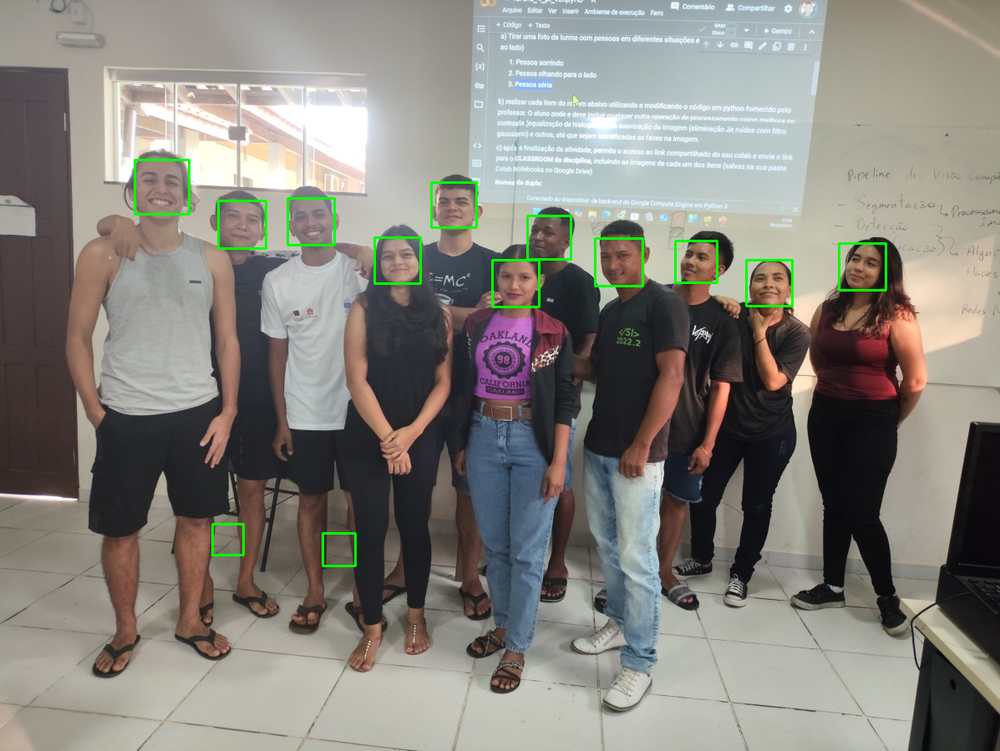

In [98]:
import cv2
from google.colab.patches import cv2_imshow

# Carregar um classificador de cascata pré-treinado para detecção de faces
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Carregar a imagem colorida
imagem = cv2.imread('IMAGEM_REDIMENSIONADA.jpg')

# Verificar se a imagem foi carregada corretamente
if imagem is None:
    print("Erro: Não foi possível carregar a imagem. Verifique o caminho.")
else:
    # Detectar rostos na imagem colorida
    rostos = face_cascade.detectMultiScale(imagem, scaleFactor=1.07, minSize=(5, 5), maxSize=(70, 70))

    # Desenhar retângulos verdes ao redor dos rostos detectados
    for (x, y, w, h) in rostos:
        cv2.rectangle(imagem, (x, y), (x + w, y + h), (0, 255, 0), 2)  # Cor verde: (B, G, R) = (0, 255, 0)

    # Mostrar a imagem com os retângulos verdes ao redor dos rostos detectados
    cv2_imshow(imagem)

    # Salvar a imagem com os retângulos verdes ao redor dos rostos
    cv2.imwrite('/content/imagem_faces2.png', imagem)


# **4) Detecçao e Desfoque de Faces com OpenCV**

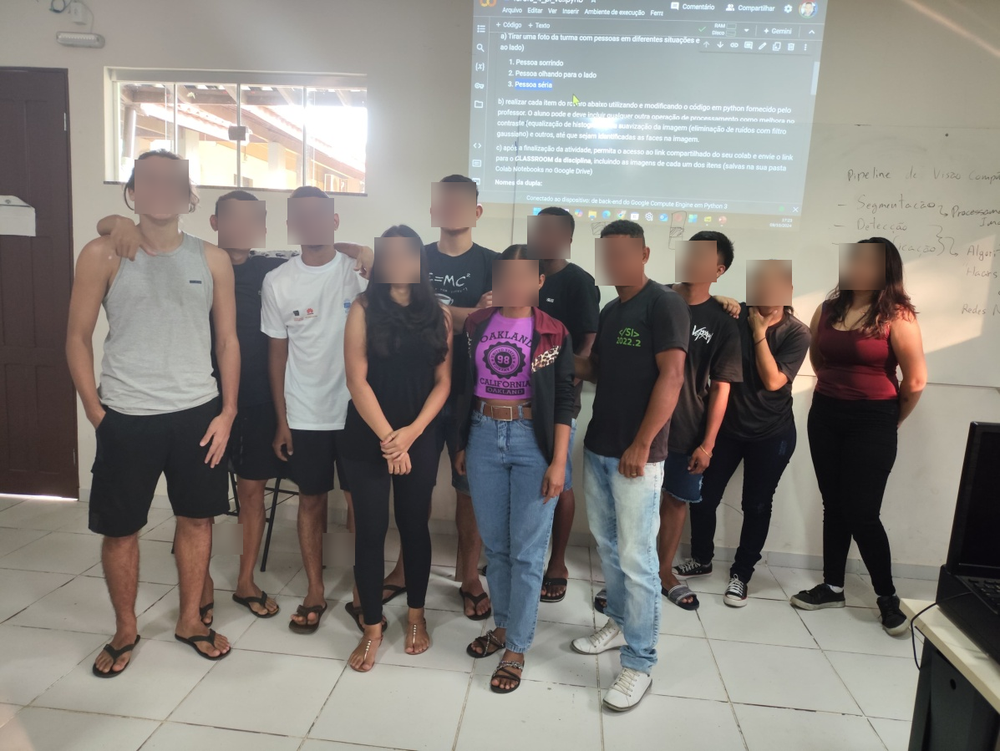

True

In [93]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

# Carregar um classificador de cascata pré-treinado para detecção de faces
classificador_faces = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Carregar a imagem
imagem3 = cv2.imread('/content/IMAGEM_REDIMENSIONADA.jpg')

# Converter a imagem para escala de cinza para detecção de faces
imagem3_cinza = cv2.cvtColor(imagem3, cv2.COLOR_BGR2GRAY)

# Detectar as faces na imagem
faces = classificador_faces.detectMultiScale(imagem3_cinza, scaleFactor=1.07, minSize=(5, 5), maxSize=(70, 70))

# Função para aplicar o filtro gaussiano a uma imagem de rosto
def aplicar_desfoque_gaussiano(rosto):
    return cv2.GaussianBlur(rosto, (0, 0), sigmaX=8)

# Iterar sobre as faces detectadas
for (x, y, w, h) in faces:
    # Obter a região de interesse (rosto)
    regiao_rosto = imagem3[y:y+h, x:x+w]

    # Aplicar o filtro gaussiano ao rosto
    rosto_desfocado = aplicar_desfoque_gaussiano(regiao_rosto)

    # Substituir o rosto original pelo rosto desfocado na imagem final
    imagem3[y:y+h, x:x+w] = rosto_desfocado

# Mostrar a imagem resultante com os rostos desfocados
cv2_imshow(imagem3) #com opencv


#******************************************************************************
# Salvar a imagem na pasta local do Colab
cv2.imwrite('/content/imagem_faces3.png', imagem3)

# **5) Detecção de Faces com Sorrisos**

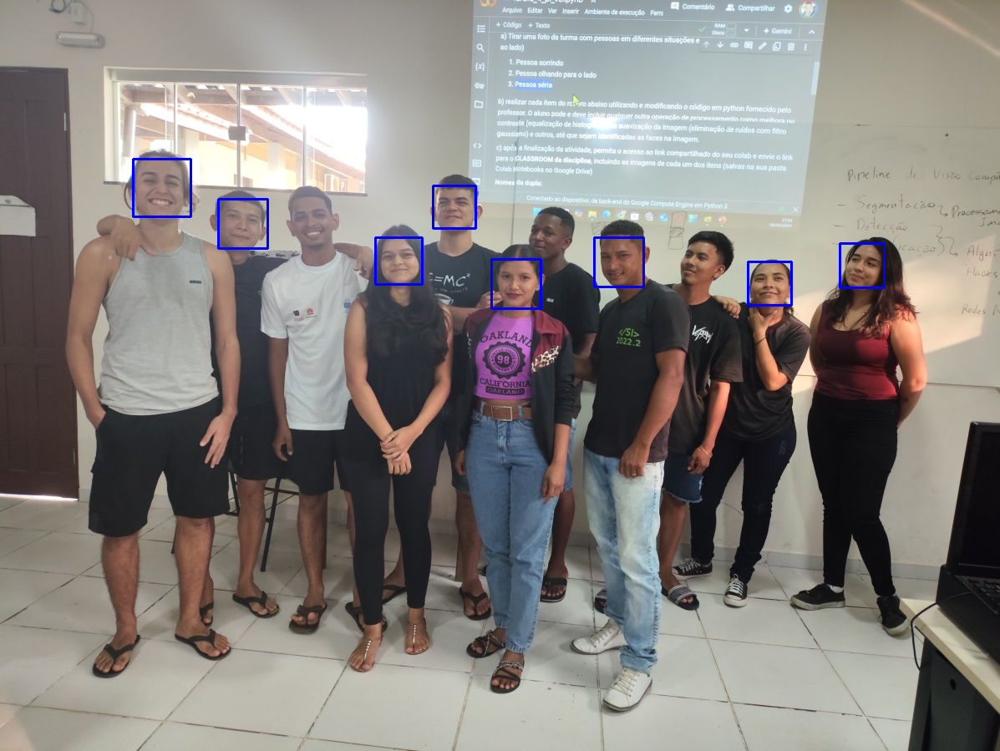

In [105]:
import cv2

# Carregar o classificador pré-treinado para detecção de faces
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Carregar o classificador pré-treinado para detecção de sorrisos
smile_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_smile.xml')

# Carregar a imagem ou capturar o vídeo (substitua pelo seu caminho ou use 0 para webcam)
imagem = cv2.imread('/content/IMAGEM_REDIMENSIONADA.jpg')  # Substitua pelo caminho correto

# Converte a imagem para escala de cinza
imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

# Detecta as faces na imagem
faces = face_cascade.detectMultiScale(imagem_cinza, scaleFactor=1.3, minNeighbors=5)

# Para cada face detectada, procurar o sorriso
for (x, y, w, h) in faces:
    # Desenhar um retângulo ao redor da face
    cv2.rectangle(imagem, (x, y), (x + w, y + h), (255, 0, 0), 2)

    # Definir a região da face
    regiao_face_cinza = imagem_cinza[y:y + h, x:x + w]
    regiao_face_colorida = imagem[y:y + h, x:x + w]

    # Detectar sorrisos dentro da região da face
    sorrisos = smile_cascade.detectMultiScale(regiao_face_cinza, scaleFactor=1.8, minNeighbors=20)

    # Para cada sorriso detectado, desenhar um retângulo
    for (sx, sy, sw, sh) in sorrisos:
        cv2.rectangle(regiao_face_colorida, (sx, sy), (sx + sw, sy + sh), (0, 255, 0), 2)

# Exibir a imagem com as detecções
cv2_imshow(imagem)

# Salvar a imagem com as detecções (opcional)
cv2.imwrite('/content/imagem_faces4.png', imagem)

# Fechar janelas abertas
cv2.destroyAllWindows()
